# 敵対的生成ネットワーク (Generative Adversarial Networks, GAN)

敵対的生成ネットワーク(Generative Adversarial Networks, GAN)は，画像生成のみならず様々な応用例があり，「機械学習において、この 10 年間でもっともおもしろいアイデア」と評する声もあります．

計算機パワーを長時間使うことで，びっくりするような出力が得られることがGANの魅力でありますが，ここでは短時間にその仕組みを理解することに重点をおきます．

*   この資料は，TAの鈴木海渡くんの[チュートリアル資料](https://colab.research.google.com/drive/1AeIzHWy4g6qujgB5n94-s9Q5DHJKVH0_)を元にしています．

## KerasでMNIST画像生成

結構重たい計算が含まれるので、ランタイムをGPUモードに切り替えて下さい。
また、以降のコードでかなりWarningが出ますが、TensorFlow内部のバージョンアップの都合なので、一旦は無視して構いません。

In [3]:
%tensorflow_version 1.x  # TensorFlow2.0のライブラリ依存関係が安定するまでは1.xでいきます

`%tensorflow_version` only switches the major version: `1.x` or `2.x`.
You set: `1.x  # TensorFlow2.0のライブラリ依存関係が安定するまでは1.xでいきます`. This will be interpreted as: `1.x`.


TensorFlow is already loaded. Please restart the runtime to change versions.


In [0]:
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# import keras
from keras.models import Sequential
from keras.layers import Dense, BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam
from keras.utils import plot_model

from torch.utils.tensorboard import SummaryWriter  # TFのFileWriter より使いやすいので，PyTorchから持ってきている．

#### データの読み込み
ここでは訓練データの画像のみ使います．ラベルは使いません．このプログラム例のように，後で使わない変数名を `_` にしておく慣習にしたがっておきましょう．

In [0]:
from keras.datasets import mnist

(X_train_orig, _), (_, _) = mnist.load_data()
X_train = X_train_orig / 127.5 - 1.0             # [-1, 1]に正規化する．

11493376/11490434 [==============================] - 1s 0us/step


いつものごとく，MNIST(手書き数字データセット）は28x28の白黒画像です。

(28, 28)


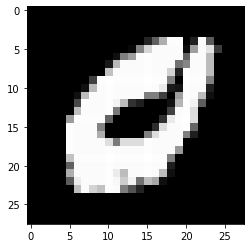

In [0]:
index = 1209   # この値を変えてみよう
print(X_train[index].shape)
plt.imshow(X_train[index], cmap='gray')
plt.show()

GANsでは、GeneratorとDiscriminatorという2つのニューラルネットワークを使います。
Generatorはノイズを入力にして、学習データセットにあるような画像を生成するように学習します。

Discriminatorは画像を入力として、入力された画像が本物なら1を、Generatorによって生成された偽物なら0を出力するように学習します。

GANsの特徴は、その学習方式にあります。Generatorは学習データセットにあるような画像を生成することを目的に学習するにも関わらず、直接的に学習データセットの画像を見ることはありません。Generatorの学習は、DiscriminatorにGeneratorが生成した画像を本物であると誤識別させるようにのみ行われます。Discriminatorは入力された画像が本物か、Generatorによって生成された偽物かを判別するように学習するので、これを誤識別させることができるなら、Generatorは本物らしい画像を出力できているだろう、というわけです。

このような役割を持つGeneratorとDiscriminatorを交互に学習することによって、Generatorは徐々に識別能力を向上させていくDiscriminatorを誤識別させ続けられるように、徐々に本物らしい画像を出力できるようになっていきます。「敵対的」という名前がついていますが、「協調的」とも言えるかもしれません。

#### 生成者 (Generator) の定義
dim_noise次元の乱数を入力にして、MNIST画像を生成します。

乱数を入力に与えるのは、学習データには多くの画像があり、多様性があるので、1つのネットワークで様々な画像を出力できるように、確率的な出力を行う関数として機能してほしいためです。画像変換の文脈では、乱数を入れる代わりにDropoutに確率的な要素を担わせる場合もあります。（https://arxiv.org/abs/1611.07004 ）

In [0]:
def make_generator(input_dimension, output_dimension):
    model = Sequential()
    model.add(Dense(256, input_dim=input_dimension))  # Denseは通常の全結合層です。
    model.add(BatchNormalization(momentum=0.8))  # バッチ正規化を入れると安定します。
    model.add(LeakyReLU(alpha=0.2))     # 経験的に、GANsではLeakyReLUでReLUよりも良い結果が出ることが多いようです。
    model.add(Dense(512))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1024))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(output_dimension, activation='tanh'))  # 学習データを[-1, 1]にしたので、出力には値域が(-1, 1)であるtanh（双曲線正接関数）をかけます
    return model

In [0]:
noise_dim = 100  # 入力にする乱数の次元

image_dim = 28 * 28    # 画像のピクセル数

generator = make_generator(noise_dim, image_dim)

作った生成器の中身を見てみましょう．

In [0]:
print(generator.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               25856     
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1024)             

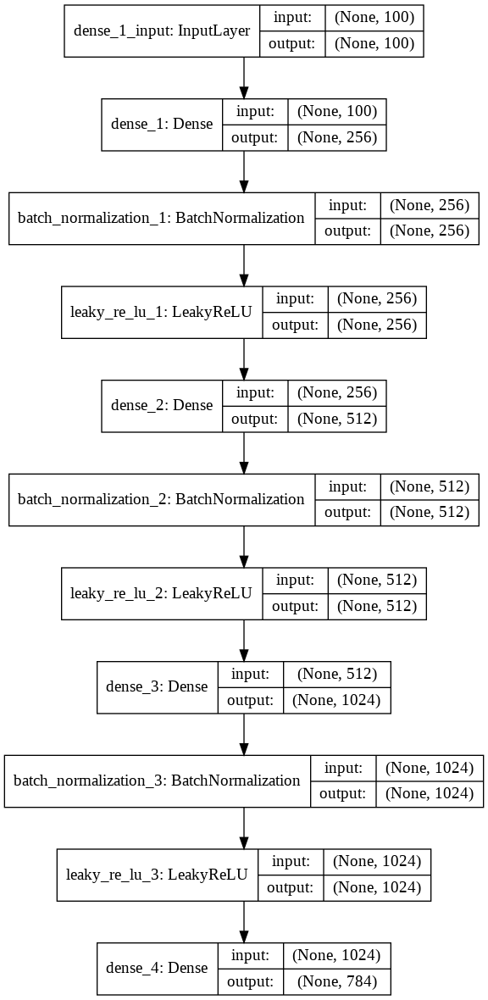

In [0]:
plot_model(generator, show_shapes=True)

まずはガウス分布に従う100次元のノイズを入れて何が出てくるか見てみましょう．
まだ何も学習していないので，単にノイズとしか思えない画像が出てくるでしょう．








(1, 784)


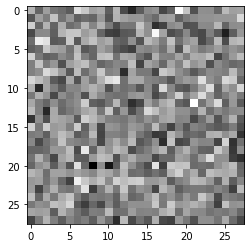

In [0]:
noise = np.random.normal(0, 1, noise_dim).reshape(1, noise_dim)
X_generated = generator.predict(noise)
print(X_generated.shape)
plt.imshow(X_generated[0].reshape(28, 28), 'gray')
plt.show()

#### Discriminatorの定義
画像をフラットにしたものを入力にして、それがデータセットから取り出してきた本物なら1を、Generatorによって生成されたものなら0を出力します。正確には、出力に値域が(0, 1)であるsigmoid関数をかけ、0と1の間の値を出力します。

In [0]:
def make_discriminator(input_dimension):
    model = Sequential()
    model.add(Dense(512, input_dim=input_dimension))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(1, activation='sigmoid'))  # 出力にはsigmoid関数をかけます。
    return model

discriminator = make_discriminator(image_dim)

作った判別器の中身を見てみます。

In [0]:
print(discriminator.summary())

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_________________________________________________________________
None


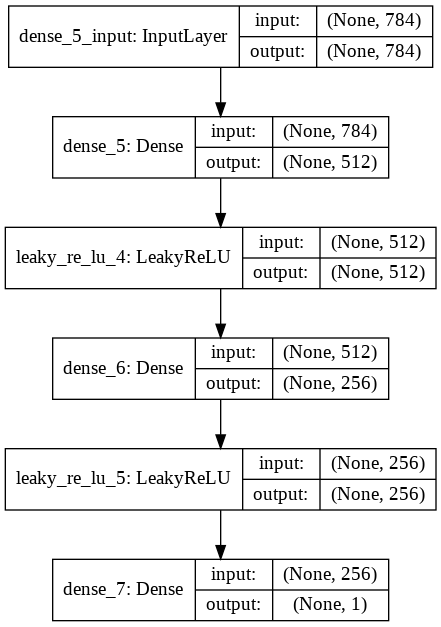

In [0]:
plot_model(discriminator, show_shapes=True)

データを入れて出力を見てみます。まだ学習していないので出力はデタラメです。出力にはsigmoid関数をかけているので(0, 1)の値が出てきます。

In [0]:
index = 0    #  色々と変えてみよう．
print(discriminator.predict(X_train[index].reshape(1, -1)))  # 本物の画像
print(discriminator.predict(X_generated))  # さっき作った偽物の画像

[[0.27772018]]
[[0.42540857]]


#### オプティマイザの設定とモデルのコンパイル
GANsにおいては、optimizerはAdamで、Adam内部の移動平均をコントロールするパラメータの1つであるbeta_1を0.5にすることが、経験的に良いと言われています。

最初にDiscriminatorをコンパイルします。これは文字通りDiscriminatorを学習するためのもので、誤差関数としてはクロスエントロピー誤差関数を用います。

In [0]:
optimizer = Adam(lr=2e-4, beta_1=0.5)
discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



次の処理が少しトリッキーです。GeneratorとDiscriminatorを連結したcombinedというモデルを用意し、Discriminatorの学習をオフにしてコンパイルします。これはGeneratorを学習するためのもので、誤差関数としては同じくクロスエントロピー誤差関数を用います。GeneratorはDiscriminatorからの、今の生成画像に対する識別のしやすさに関する勾配情報を元にして学習を進めるため、Generatorの学習にはDiscriminatorが常に必要です。また、GeneratorがDiscriminatorを誤識別させるように学習している最中にDiscriminatorも更新してしまうと、これはDiscriminatorが自ら誤識別しやすいように学習してしまうことを意味します。そのため、combinedモデルのコンパイルではDiscriminatorの学習を切っています。ちなみに、Kerasではコンパイルした時点での設定を参照するので、Discriminatorの学習においては問題なくDiscriminatorが更新されます。

In [0]:
discriminator.trainable = False
combined = Sequential([generator, discriminator])
combined.compile(loss='binary_crossentropy', optimizer=optimizer)

#### ログの準備
TensorBoardを使ってリアルタイムでロスや画像生成の様子を観察します。

In [0]:
logdir = './log/' + datetime.now().strftime('%Y%m%d_%H%M')
writer = SummaryWriter(log_dir=logdir)

%load_ext tensorboard
%tensorboard --logdir $logdir

#### 学習の開始（8分前後かかります）
いよいよ学習を開始します。GANsの学習においては、GeneratorとDiscriminatorを交互に更新しなければならないため、.fit()は使えず、学習ループを自分で記述する必要があります。とはいえ、これについてもKerasにはサポートをしてくれるメソッドがあるため、そこまで難しくありません。学習の様子は、上のTensorBoardでリアルタイムに確認できます。注意点として、通常の機械学習と異なり、GANsの学習は訓練誤差が減少しないからといって失敗とは限りません。

In [0]:
%%time
# 学習は、学習データからその一部分をミニバッチとして切り出し、それを使った更新を繰り返す
# ミニバッチ確率的勾配降下法で行います。そのためのバッチサイズをここで設定します。
batch_size = 32

# それぞれreal、fake画像用のラベルです。realなら常に1, fakeなら0です。
real = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

n_iterations = 10000    # もう少し増やしてもよいかもしれない

for iteration in range(1, n_iterations+1):
    X_batch = X_train[np.random.randint(0, X_train.shape[0], batch_size)]  # ランダムにミニバッチを選んできます。
    X_batch = X_batch.reshape(batch_size, -1)  # 画像を1次元に平らにします。

    # ---------------------
    #  Discriminatorの更新
    # ---------------------
    # 入力の乱数はガウス分布を使い、Generatorで画像を生成します。
    noise = np.random.normal(0, 1, (batch_size, noise_dim))
    X_generated = generator.predict(noise)

    d_loss_real = discriminator.train_on_batch(X_batch, real)  # 学習データからの画像を本物と正しく識別するように更新。
    d_loss_fake = discriminator.train_on_batch(X_generated, fake)  # Generatorの生成した画像を偽物と正しく識別するように更新。
    d_loss = 0.5 * (d_loss_real + d_loss_fake)
    # ロスをTensorBoardに記録
    writer.add_scalar('discriminator loss', d_loss, iteration)
    writer.add_scalar('discriminator detail/real', d_loss_real, iteration)
    writer.add_scalar('discriminator detail/fake', d_loss_fake, iteration)

    # -----------------
    #  Generatorの更新
    # -----------------
    noise = np.random.normal(0, 1, (batch_size, noise_dim))
    # Generatorの生成した画像を、本物であると誤識別させるように更新。
    g_loss = combined.train_on_batch(noise, real)
    # ロスをTensorBoardに記録
    writer.add_scalar('generator loss', g_loss, iteration)

    # 500 iterationごとに今の状況をここにも出力し、同時にTensorBoardにGeneratorの生成画像を5枚保存します。
    if iteration % 500 == 0:
        print('iteration [%d/%d] discriminator loss:%1.4f generator loss:%1.4f' % (iteration, n_iterations, d_loss, g_loss))
        noise = np.random.normal(0, 1, (5, noise_dim))
        generated_images = generator.predict(noise)
        for i, generated_image in enumerate(generated_images):
            writer.add_image('%d/generated_image%d' % (iteration, i), generated_image.reshape(1, 28, 28),iteration)
writer.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


iteration [500/10000] discriminator loss:0.6855 generator loss:0.7467
iteration [1000/10000] discriminator loss:0.6946 generator loss:0.7284
iteration [1500/10000] discriminator loss:0.6171 generator loss:0.7797
iteration [2000/10000] discriminator loss:0.6805 generator loss:0.8030
iteration [2500/10000] discriminator loss:0.6276 generator loss:0.8200
iteration [3000/10000] discriminator loss:0.6895 generator loss:0.7980
iteration [3500/10000] discriminator loss:0.6825 generator loss:0.8354
iteration [4000/10000] discriminator loss:0.6095 generator loss:0.8485
iteration [4500/10000] discriminator loss:0.6771 generator loss:0.8504
iteration [5000/10000] discriminator loss:0.6910 generator loss:0.8519
iteration [5500/10000] discriminator loss:0.6635 generator loss:1.0576
iteration [6000/10000] discriminator loss:0.6648 generator loss:0.9048
iteration [6500/10000] discriminator loss:0.6406 generator loss:0.9254
iteration [7000/10000] discriminator loss:0.6034 generator loss:0.9371
iterati

学習にはこのように長い時間がかかりますが，学習ができあがってしまえば，潜在空間のノイズから画像を生成するにはほとんど時間がかかりません．冒頭で試した試したのと同じものを何度か再度実行してみましょう．（[Shift]+[Return]の代わりに[Control]+[Return]を使うと便利です）

(1, 784)


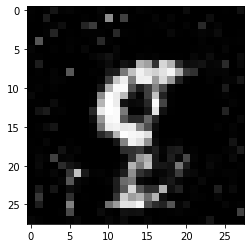

In [0]:
noise = np.random.normal(0, 1, noise_dim).reshape(1, noise_dim)
X_generated = generator.predict(noise)
print(X_generated.shape)
plt.imshow(X_generated[0].reshape(28, 28), 'gray')
plt.show()

#### ノイズ空間（潜在空間）を用いた補完
Generatorに与えたノイズの構成する空間のことを、潜在空間と呼びます。

各ノイズはGeneratorによって何らかの画像と対応付けられており、潜在空間上で様々な操作を行うことが出来ます。1つは、変分オートエンコーダ(VAE)でもやったような，潜在空間による線形補間を用いた画像の補間です。

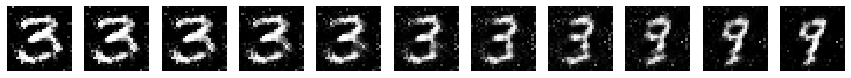

In [0]:
point1 = np.random.normal(0, 1, noise_dim)
image_at_point1 = generator.predict(point1.reshape(1, -1)).reshape((28, 28))

point2 = np.random.normal(0, 1, noise_dim)
image_at_point2 = generator.predict(point2.reshape(1, -1)).reshape((28, 28))

fig, axis = plt.subplots(ncols=11, figsize=(15, 3))
for i in range(11):
    interpolated_point = point1 * (1.0 - 0.1*i) + point2*0.1*i
    interpolated_image = generator.predict(interpolated_point.reshape(1, -1)).reshape((28, 28))
    axis[i].imshow(interpolated_image, cmap='gray')
    axis[i].axis('off')

同じ２つの画像を，単にピクセル空間上で線形補完を行ってみたものと比べてみましょう．

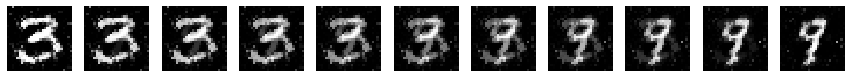

In [0]:
fig, axis = plt.subplots(ncols=11, figsize=(15, 3))
for i in range(11):
    interpolated_image_by_pixel = image_at_point1 * (1.0 - 0.1*i) + image_at_point2*0.1*i
    axis[i].imshow(interpolated_image_by_pixel, cmap='gray')
    axis[i].axis('off')

## DCGAN (Deep Convolutional Generative Adversarial Networks)





このネットワークの構成には[Fashion-MNISTを使ってDCGANを試してみた](https://qiita.com/God_KonaBanana/items/293d49e3c34601a1810b) などを参考にしています．

#### Generator の定義

In [0]:
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.layers import Reshape, Activation


def make_generator_dc(input_dimension):
    model = Sequential()
    model.add(Dense(1024, input_dim=input_dimension))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dense(128*7*7))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((7, 7, 128), input_shape=(128*7*7,)))
    model.add(UpSampling2D((2, 2)))
    model.add(Conv2D(64, kernel_size=(5,5), padding='same'))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(UpSampling2D((2, 2)))
    model.add(Conv2D(1, kernel_size=(5,5), padding='same'))
    model.add(Activation('tanh')) 
    return model


noise_dim = 100  # 入力にする乱数の次元

generator_dc = make_generator_dc(noise_dim)

# 今作ったモデルの中身を見てみます
print(generator_dc.summary())

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 1024)              103424    
_________________________________________________________________
batch_normalization_4 (Batch (None, 1024)              4096      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 1024)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 6272)              6428800   
_________________________________________________________________
batch_normalization_5 (Batch (None, 6272)              25088     
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 6272)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 128)        

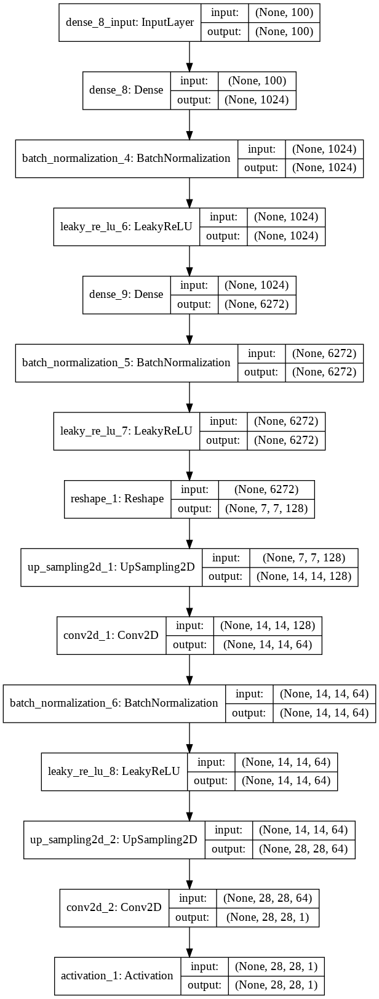

In [0]:
plot_model(generator_dc, show_shapes=True)

ここでも，学習前ですが，ガウス分布に従う100次元のノイズを入れて何が出てくるか見てみましょう． 

[Shift]+[Return] の代わりに [Control]+[Return] を押すと，同じセルを何度か評価するのに便利です．何度か実行して，どんな絵が見えるかを試してみるとよいでしょう．

(1, 28, 28, 1)


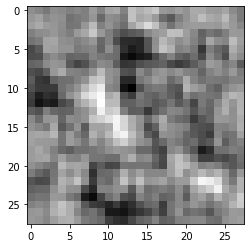

In [0]:
noise = np.random.normal(0, 1, noise_dim).reshape(1, noise_dim)
X_generated = generator_dc.predict(noise)
print(X_generated.shape)
plt.imshow(X_generated[0].reshape(28,28), 'gray')
plt.show()

#### Discriminator の定義

In [0]:
from keras.layers import Flatten, Dropout

def make_discriminator_dc(input_shape):
    model = Sequential()
    model.add(Conv2D(64, kernel_size=(5, 5),
                            strides=(2, 2),
                            padding="same",
                            input_shape=input_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, kernel_size=(5, 5), strides=(2, 2)))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Flatten())
    model.add(Dense(256))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.5))
    model.add(Dense(1, activation='sigmoid'))  # 出力にはsigmoid関数をかけます。
    return model

discriminator_dc = make_discriminator_dc( (28, 28, 1) )
# 今作ったモデルの中身を見てみます。
print(discriminator_dc.summary())

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 14, 14, 64)        1664      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 5, 5, 128)         204928    
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 5, 5, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 3200)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 256)               819456    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 256)              

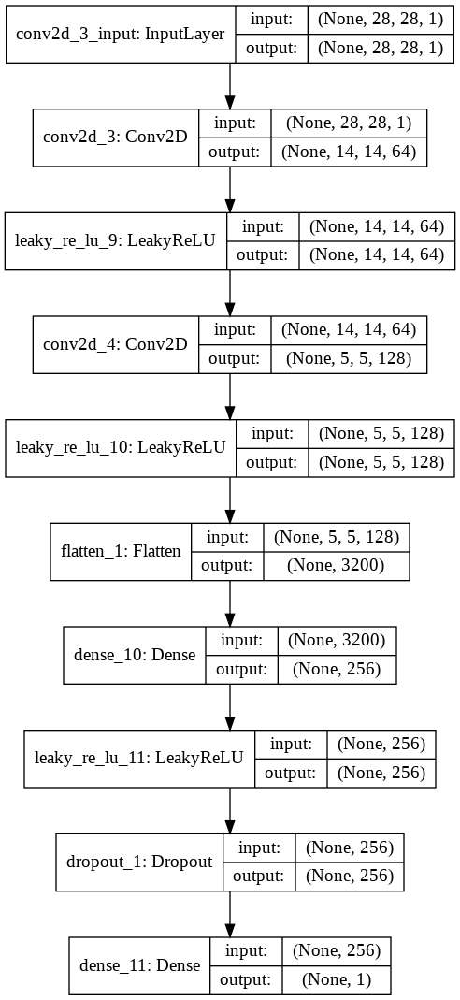

In [0]:
plot_model(discriminator_dc, show_shapes=True)

In [0]:
index = 0    #  色々と変えてみよう．
print(discriminator_dc.predict(X_train[index].reshape(1,28,28,1)))  # 本物の画像
print(discriminator_dc.predict(X_generated.reshape(1,28,28,1)))  # さっき作った偽物の画像

[[0.46241507]]
[[0.4971621]]


#### オプティマイザの設定とモデルのコンパイル

In [0]:
optimizer = Adam(lr=2e-4, beta_1=0.5)
discriminator_dc.compile(loss='binary_crossentropy', optimizer=optimizer)

In [0]:
discriminator_dc.trainable = False
combined_dc = Sequential([generator_dc, discriminator_dc])
combined_dc.compile(loss='binary_crossentropy', optimizer=optimizer)

#### ログの準備

In [0]:
logdir = './log/' + datetime.now().strftime('%Y%m%d_%H%M')
writer = SummaryWriter(log_dir=logdir)

%load_ext tensorboard
%tensorboard --logdir $logdir

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


#### 学習の開始 (10分ぐらいかかります）

In [0]:
%%time
# 学習は、学習データからその一部分をミニバッチとして切り出し、それを使った更新を繰り返す
# ミニバッチ確率的勾配降下法で行います。そのためのバッチサイズをここで設定します。
batch_size = 32

# それぞれreal、fake画像用のラベルです。realなら常に1, fakeなら0です。
real = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

n_iterations = 10000    # もう少し増やしてもよいかもしれない

for iteration in range(1, n_iterations+1):
    X_batch = X_train[np.random.randint(0, X_train.shape[0], batch_size)]  # ランダムにミニバッチを選んできます。
    X_batch = X_batch.reshape(batch_size, 28, 28, 1)    # 画像データを (28, 28, 1) に変換する

    # ---------------------
    #  Discriminatorの更新
    # ---------------------
    # 入力の乱数はガウス分布を使い、Generatorで画像を生成します。
    noise = np.random.normal(0, 1, (batch_size, noise_dim))
    X_generated = generator_dc.predict(noise)

    d_loss_real = discriminator_dc.train_on_batch(X_batch, real)  # 学習データからの画像を本物と正しく識別するように更新。
    d_loss_fake = discriminator_dc.train_on_batch(X_generated, fake)  # Generatorの生成した画像を偽物と正しく識別するように更新。
    d_loss = 0.5 * (d_loss_real + d_loss_fake)
    # ロスをTensorBoardに記録
    writer.add_scalar('discriminator loss', d_loss, iteration)
    writer.add_scalar('discriminator detail/real', d_loss_real, iteration)
    writer.add_scalar('discriminator detail/fake', d_loss_fake, iteration)

    # -----------------
    #  Generatorの更新
    # -----------------
    noise = np.random.normal(0, 1, (batch_size, noise_dim))
    # Generatorの生成した画像を、本物であると誤識別させるように更新。
    g_loss = combined_dc.train_on_batch(noise, real)
    # ロスをTensorBoardに記録
    writer.add_scalar('generator loss', g_loss, iteration)

    # 500 iterationごとに今の状況をここにも出力し、同時にTensorBoardにGeneratorの生成画像を5枚保存します。
    if iteration % 500 == 0:
        print('iteration [%d/%d] discriminator loss:%1.4f generator loss:%1.4f' % (iteration, n_iterations, d_loss, g_loss))
        noise = np.random.normal(0, 1, (5, noise_dim))
        generated_images = generator_dc.predict(noise)
        for i, generated_image in enumerate(generated_images):
            writer.add_image('%d/generated_image%d' % (iteration, i), generated_image.reshape(1, 28, 28),iteration)
writer.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


iteration [500/10000] discriminator loss:0.6941 generator loss:0.8778
iteration [1000/10000] discriminator loss:0.6920 generator loss:0.8492
iteration [1500/10000] discriminator loss:0.6409 generator loss:0.7363
iteration [2000/10000] discriminator loss:0.6232 generator loss:0.8426
iteration [2500/10000] discriminator loss:0.6041 generator loss:0.9418
iteration [3000/10000] discriminator loss:0.6401 generator loss:0.8965
iteration [3500/10000] discriminator loss:0.5836 generator loss:0.9437
iteration [4000/10000] discriminator loss:0.6283 generator loss:0.9143
iteration [4500/10000] discriminator loss:0.6483 generator loss:1.0068
iteration [5000/10000] discriminator loss:0.6092 generator loss:0.9467
iteration [5500/10000] discriminator loss:0.6260 generator loss:1.0056
iteration [6000/10000] discriminator loss:0.6322 generator loss:1.0307
iteration [6500/10000] discriminator loss:0.6547 generator loss:0.9815
iteration [7000/10000] discriminator loss:0.5903 generator loss:1.1412
iterati

(1, 28, 28, 1)


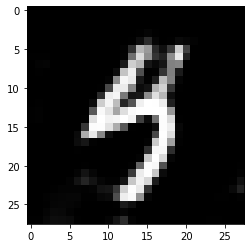

In [0]:
noise = np.random.normal(0, 1, noise_dim).reshape(1, noise_dim)
X_generated = generator_dc.predict(noise)
print(X_generated.shape)
plt.imshow(X_generated[0].reshape(28,28), 'gray')
plt.show()

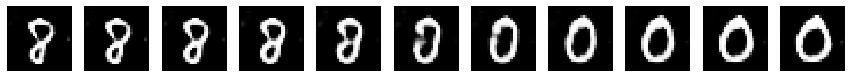

In [0]:
point1 = np.random.normal(0, 1, noise_dim)
image_at_point1 = generator_dc.predict(point1.reshape(1, -1)).reshape((28, 28))

point2 = np.random.normal(0, 1, noise_dim)
image_at_point2 = generator_dc.predict(point2.reshape(1, -1)).reshape((28, 28))

fig, axis = plt.subplots(ncols=11, figsize=(15, 3))
for i in range(11):
    interpolated_point = point1 * (1.0 - 0.1*i) + point2*0.1*i
    interpolated_image = generator_dc.predict(interpolated_point.reshape(1, -1)).reshape((28, 28))
    axis[i].imshow(interpolated_image, cmap='gray')
    axis[i].axis('off')

ここでも同じ２つの画像を，単にピクセル空間上で線形補完を行ってみたものと比べてみましょう．

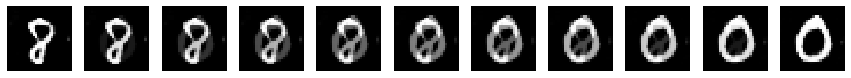

In [0]:
fig, axis = plt.subplots(ncols=11, figsize=(15, 3))
for i in range(11):
    interpolated_image_by_pixel = image_at_point1 * (1.0 - 0.1*i) + image_at_point2*0.1*i
    axis[i].imshow(interpolated_image_by_pixel, cmap='gray')
    axis[i].axis('off')

## 練習課題



【練習課題】MNIST の代わりに，Fashin_MNIST のデータを使って一連の動作を確認してみよう．

ヒント：冒頭のデータの読み込み部分を書き換えて実行しよう．
```
from keras.datasets import fashion_mnist

(X_train_orig, _), (_, _) = fashion_mnist.load_data()
```